# Column Names and descriptions for King County Data Set
* **id** - unique identified for a house
* **dateDate** - house was sold
* **pricePrice** -  is prediction target
* **bedroomsNumber** -  # of bedrooms
* **bathroomsNumber** - # of bathrooms
* **sqft_livingsquare** -  footage of the home
* **sqft_lotsquare** -  footage of the lot
* **floorsTotal** -  floors (levels) in house
* **waterfront** - House which has a view to a waterfront
* **view** - Has been viewed
* **condition** - How good the condition is ( Overall )
* **grade** - overall grade given to the housing unit, based on King County grading system
* **sqft_above** - square footage of house apart from basement
* **sqft_basement** - square footage of the basement
* **yr_built** - Built Year
* **yr_renovated** - Year when house was renovated
* **zipcode** - zip
* **lat** - Latitude coordinate
* **long** - Longitude coordinate
* **sqft_living15** - The square footage of interior housing living space for the nearest 15 neighbors
* **sqft_lot15** - The square footage of the land lots of the nearest 15 neighbors

### **The Stakeholder is Nicole Johnson**

He wants to buy a house with this criteria:
- The house in the lively and central neighborhood
- The house is middle price range
- He looks for the best time in a year to buy a house

In [1]:
# Import the libraries

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy import stats

%matplotlib inline

In [2]:
#Load the dataset into DataFrame

df = pd.read_csv("../data/King_County_House_prices_dataset.csv")
df.shape

(21597, 21)

# Manage Dataset

### 1. Check the missing values (NaN) from dataset, and replace them by value "0"

In [3]:
#check and count how many missing values in each column

print(df.isna().sum())

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64


In [4]:
#fill the NaN with 0
df.fillna(0, inplace=True)


### 2. Removing outlier

In [5]:
#removing outliers

var = df[["price", "bedrooms", "bathrooms", "sqft_living", "sqft_lot", "floors", "view", "condition" , "grade", "sqft_above", "sqft_living15", "sqft_lot"]]

import numpy as np
from scipy import stats
z = np.abs(stats.zscore(var))
z

df = df[(z < 3).all(axis=1)]

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19842 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             19842 non-null  int64  
 1   date           19842 non-null  object 
 2   price          19842 non-null  float64
 3   bedrooms       19842 non-null  int64  
 4   bathrooms      19842 non-null  float64
 5   sqft_living    19842 non-null  int64  
 6   sqft_lot       19842 non-null  int64  
 7   floors         19842 non-null  float64
 8   waterfront     19842 non-null  float64
 9   view           19842 non-null  float64
 10  condition      19842 non-null  int64  
 11  grade          19842 non-null  int64  
 12  sqft_above     19842 non-null  int64  
 13  sqft_basement  19842 non-null  object 
 14  yr_built       19842 non-null  int64  
 15  yr_renovated   19842 non-null  float64
 16  zipcode        19842 non-null  int64  
 17  lat            19842 non-null  float64
 18  long  

### 3. Convert date column into datetime format

In [6]:
df["date"] = pd.to_datetime(df["date"])

### 4. Create new columns with Month seperated

In [7]:
# create column month, with string
import calendar

df["month"] = df['date'].dt.month
df['month'] = df['month'].apply(lambda x: calendar.month_name[x])
df["month_n"] = df['date'].dt.month
df.head()

# change orders of index column, moving month next to date
df.columns
df = df[['id', 'date', "month_n", 'month', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15']]
df.head()

,id,date,month_n,month,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,10,October,221900.0,3,1.00,1180,5650,1.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,2014-12-09,12,December,538000.0,3,2.25,2570,7242,2.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2015-02-25,2,February,180000.0,2,1.00,770,10000,1.0,...,6,770,0.0,1933,0.0,98028,47.7379,-122.233,2720,8062
3,2487200875,2014-12-09,12,December,604000.0,4,3.00,1960,5000,1.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2015-02-18,2,February,510000.0,3,2.00,1680,8080,1.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


### Subset the houses data, only in the center neighborhood.
*fulfills the first criteria of Nicole's dream house*

Nicole wants a house in the lively areas and center neighborhood, I suggest him to pick one in the Seattle neighborhood.
Therefore, I filtered the house data using the Zipcodes from the central areas in Seattle.



In [8]:
seattle = [98101, 98102, 98103, 98104, 98105, 98106, 98107, 98108, 98109, 98112, 98115, 98116, 98117, 98118, 98119, 98121, 98122, 98125, 98126, 98133, 98134, 98136, 98144, 98146, 98154, 98164, 98174, 98177, 98178, 98195, 98199]

#Read more: http://www.city-data.com/zipmaps/Seattle-Washington.html

df.query("zipcode in @seattle", inplace=True)
df.shape 

(7025, 22)

In [9]:
#df.query("price >= price.quantile(0.3) and price <= price.quantile(0.7)", inplace=True)

#df.shape

## Exploratory Data Analysis

### Show the map of neighborhood that Nicole's future house will be located around 

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

<Figure size 1296x720 with 0 Axes>

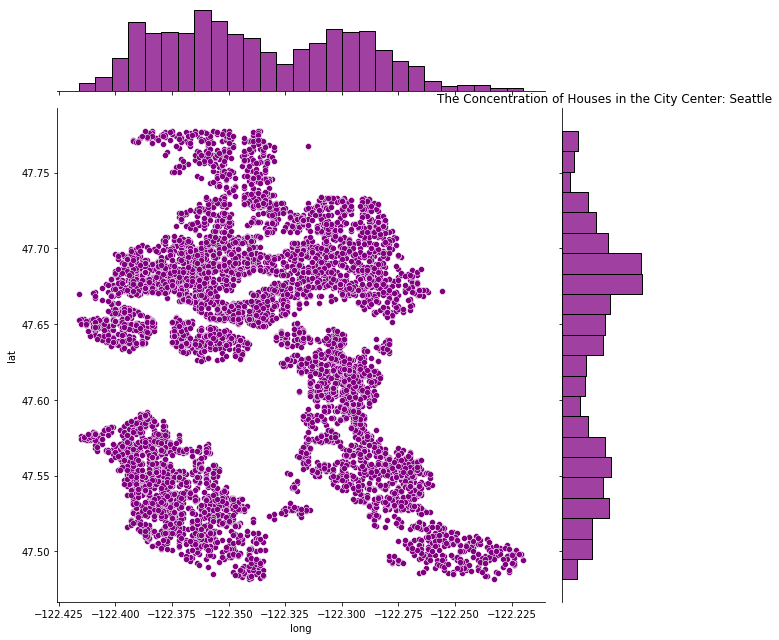

In [10]:
# map plotly (will figure it out later)


plt.figure(figsize=(18,10))
sns_map = sns.jointplot(x=df.long, y=df.lat, size=9, color= "purple") 
"""plt.ylabel('Latitude', fontsize=12
plt.xlabel('Longtitude', fontsize=12)""" 
plt.title("The Concentration of Houses in the City Center: Seattle")
sns.despine

In [11]:
# correlation plot with plotly

#convert values in dataframe df to correlation values
corr_df = df.corr(method="pearson")
print(corr_df.head(3))

               id   month_n     price  bedrooms  bathrooms  sqft_living  \
id       1.000000  0.002922 -0.005414 -0.005002  -0.030766    -0.021255   
month_n  0.002922  1.000000 -0.015311 -0.005769   0.026706     0.029910   
price   -0.005414 -0.015311  1.000000  0.352373   0.454630     0.673191   

         sqft_lot    floors      view  condition     grade  sqft_above  \
id      -0.034655 -0.020680  0.004568   0.003033 -0.014519   -0.020958   
month_n -0.019318  0.026644 -0.008428   0.039427  0.026183    0.027708   
price   -0.003535  0.229041  0.215624   0.178449  0.635940    0.618232   

         yr_built  yr_renovated   zipcode       lat      long  sqft_living15  \
id      -0.038760     -0.001617 -0.069092 -0.004941  0.062577      -0.036797   
month_n  0.002836      0.019046 -0.005733  0.014396  0.008274       0.017653   
price   -0.069601      0.129269 -0.094405  0.246254 -0.066218       0.559144   

         sqft_lot15  
id        -0.033420  
month_n   -0.009471  
price     -0.03

In [12]:
import plotly.graph_objects as go

fig_heatmap = go.Figure(go.Heatmap(
        x=corr_df.columns,
        y=corr_df.columns,
        z=corr_df.values.tolist(),
        colorscale='rdylgn', zmin=-1, zmax=1))

fig_heatmap.update_layout(height=600, width=800, #ideally height= 1000, and width=800, it takes the notebook slower
                  title_text="House Features Influenced the Price")
fig_heatmap.show()

## Look Closer into the most correlated features

## Plot Relations

In [13]:
sql_bed = df.groupby("id").agg({"sqft_living" : "mean", "bedrooms": "mean", "price": "median"})


import plotly.express as px
fig_sql_bed = px.scatter(
    sql_bed, x ='sqft_living', y='price', opacity=0.65,
    trendline='ols', hover_data=['bedrooms'], color='bedrooms'
)
fig_sql_bed.update_layout(title_text="The average of sqft living & bedrooms with medium-ranged price")
fig_sql_bed.show()

In [14]:
sqabove_floors = df.groupby("id").agg({"sqft_above" : "mean", "floors": "mean", "price": "median"})

import plotly.express as px
fig_sqabove_floors = px.scatter(
    sqabove_floors, x ='sqft_above', y='price', opacity=0.65,
    trendline='ols', hover_data=['floors'], color='floors'
)
fig_sqabove_floors.update_layout(title_text="The average of sqft above & floors with medium-ranged price")
fig_sqabove_floors.show()

In [15]:
sql_grade = df.groupby("id").agg({"sqft_living" : "mean", "grade": "mean", "price": "median"})


import plotly.express as px
fig_sql_grade = px.scatter(
    sql_grade, x ='sqft_living', y='price', opacity=0.65,
    trendline='ols', hover_data=['grade'], color='grade'
)
fig_sql_grade.update_layout(title_text="The average of sqft living & grade with medium-ranged price")
fig_sql_grade.show()

In [16]:
sqabove_cond = df.groupby("id").agg({"sqft_above" : "mean", "condition": "mean", "price": "median"})


import plotly.express as px
fig_sqabove_cond = px.scatter(
    sqabove_cond, x ='sqft_above', y='price', opacity=0.65,
    trendline='ols', hover_data=['condition'], color='condition'
)
fig_sqabove_cond.update_layout(title_text="The average of sqft above & condition with medium-ranged price")
fig_sqabove_cond.show()

## plot time

In [17]:
medium_price_month = df.sort_values("month_n")

medium_price_month["year"] = df['date'].dt.year

fig_date = px.scatter(medium_price_month, x = "sqft_living", y = "price", animation_frame="month_n", animation_group= "zipcode", size = "bedrooms", color = "grade", hover_name= "zipcode", labels=dict(month_n= "month", sqft_living= "Size of House Interior", price= "mid-ranged price", bedrooms="number of bedrooms", grade = "house grade"))

fig_date.update_layout(title_text="The Price Transition over the periods based on some parameters")
fig_date.show()

In [18]:
import plotly.graph_objects as go
medium_price= df.query("price >= price.quantile(0.3) and price <= price.quantile(0.7)")

plotly_map = go.Figure(data=go.Scattergeo(
        lon = medium_price['long'],
        lat = medium_price['lat'],
        text = medium_price["price"],
        mode = 'markers',
        marker_color = medium_price['zipcode'],
        ))

plotly_map.update_layout(
        title = 'The Houses in the Seattle based on Prices',
        geo_scope='usa',
    )
plotly_map.show()

## plot Modeling - Single & Multi Linear Regression with OLS

In [19]:
# libraries for regression & plots
from statsmodels.formula.api import ols
import statsmodels.api as sm
from statsmodels.graphics.regressionplots import plot_partregress_grid
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf

0.9020092330888689
sqft_living    296.1487
dtype: float64


Text(0.5, 1.0, 'OLS Model for Linear Regression (Price vs Sqlt_Living')

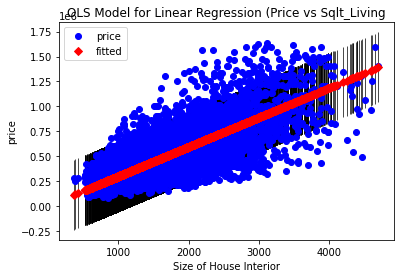

In [20]:
# single regression

ols_model_1 = ols("price ~ sqft_living + 0", data = df).fit()
print(ols_model_1.rsquared)
print(ols_model_1.params)

fig_ols1, ax = plt.subplots()
fig_ols1 = sm.graphics.plot_fit(ols_model_1, 0, ax=ax)
ax.set_ylabel("price")
ax.set_xlabel("Size of House Interior")
ax.set_title("OLS Model for Linear Regression (Price vs Sqlt_Living")


0.8780479555250974
grade    73001.855116
dtype: float64


Text(0.5, 1.0, 'OLS Model for Linear Regression (Price vs Grade')

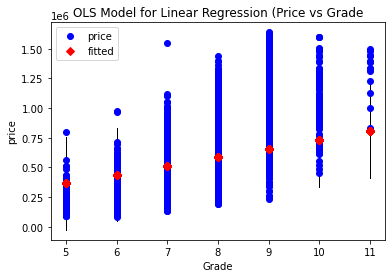

In [26]:
# single regression
ols_model_2 = ols("price ~ grade + 0", data = df).fit()
print(ols_model_2.rsquared)
print(ols_model_2.params)

fig_ols2, ax = plt.subplots()
fig_ols2 = sm.graphics.plot_fit(ols_model_2, 0, ax=ax)
ax.set_ylabel("price")
ax.set_xlabel("Grade")
ax.set_title("OLS Model for Linear Regression (Price vs Grade")

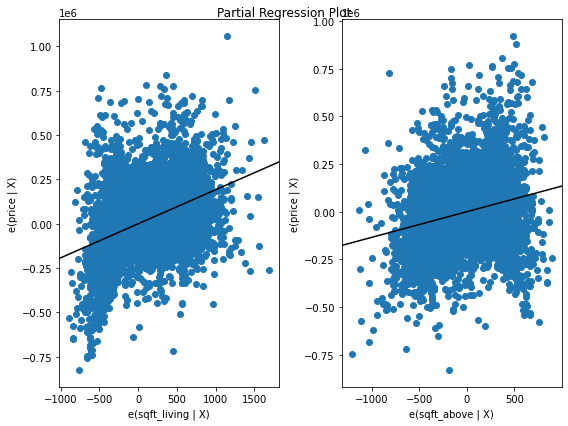

In [22]:
# multiple regression sqft_living & sqft_above

fig_ols_3 = plt.figure(figsize=(8, 6))
results = ols('price ~ sqft_living + sqft_above + 0', data=df).fit()
plot_partregress_grid(results, fig=fig_ols_3)
plt.show()

In [23]:
# import library for modeling
import statsmodels.api as sms
from sklearn.model_selection import train_test_split

# pick more explanatory Features for modeling
features = df[["bedrooms", "bathrooms", "floors", "view", "sqft_living", "grade", "sqft_above", "sqft_living15"]]
response = df["price"]

X = features
X = sms.add_constant(X)
y = response

# split the train and text data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.02, random_state= 101)


#create the OLS model for multiple X-variables
model = sms.OLS(y_train, X_train)
results = model.fit()
#results.summary()

y_pred = results.predict(X_test)

from sklearn.metrics import mean_absolute_error, mean_squared_error
# Evaluating Model's Performance
print('Mean Absolute Error:', round(mean_absolute_error(y_test, y_pred)))



Mean Absolute Error: 111497


### Modeling with Scikit Linear Regression

In [24]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

features = df[["bedrooms", "sqft_living", "grade", "sqft_above"]]
response = df["price"]

X = features
y = response


X_train, X_test, y_train, y_test = train_test_split(features, response, test_size= 0.02, random_state= 101)

lr = LinearRegression()
model = lr.fit(X_train, y_train)

y_pred = model.predict(X_test)

print(r2_score(y_test, y_pred))

0.5074724291844841


In [28]:
import dash
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
import dash_bootstrap_components as dbc
from dash.dependencies import Input, Output

# Stylesheet
app = dash.Dash(
    external_stylesheets=[dbc.themes.BOOTSTRAP]
)

In [29]:
def getPlot(plotObject, title, notes=""):
    return html.Div([
        dbc.Card([
            dbc.CardHeader([
                html.H5(title,
                       className="mb-0")
            ]),
            dbc.CardBody([
                dcc.Graph(
                    figure = plotObject.update_layout(
                        template='plotly_dark',
                        plot_bgcolor= 'rgba(0, 0, 0, 0)',
                        paper_bgcolor= 'rgba(0, 0, 0, 0)',
                    ),config={
                        'displayModeBar': False
                    }
                )
            ], className="p-1"),
            dbc.CardFooter([
                html.P(notes,
                      className="mb-0")
            ])
        ])
    ])

# Build App
app = JupyterDash(external_stylesheets=[dbc.themes.SLATE])
notes=''

app.layout = html.Div([
    dbc.Card(
        dbc.CardBody([
            dbc.Row([
                dbc.Col([
                    getPlot(sns_map, 'The Concentration of Houses in the City Center', 'The Lively-Centered Neighborhood: The Strategic Locations')
                ], width=12),
            ], align='center'), 
            html.Br(),
            dbc.Row([
                dbc.Col([
                    getPlot(fig_heatmap, 'The House Features', "How particular features of houses influence the price")
                ], width=6),
                dbc.Col([
                    getPlot(fig_sql_bed, "The Relationship between House Interior's size and the Price", "bigger house tends to have more bedrooms, more bedrooms tends to be more expensive too")
                ], width=6),
            ], align='start'), 
            html.Br(),
            dbc.Row([
                dbc.Col([
                    getPlot(fig_sqabove_floors, "The Relationship between House size (apart from Basement) and the Price", "number of floors are not determined by size")
                ], width=6),
                dbc.Col([
                    getPlot(fig_sql_grade, 'Are grades really matter to price? do bigger houses always have better grade than smaller one? ')
                ], width=6),
                dbc.Row([
                    dbc.Col([
                        getPlot(fig_sqabove_cond, "The Relationship between House size (apart from Basement) and the Price", "are conditions matter?")
                ], width=6),
                    dbc.Col([
                        getPlot(fig_date, "Let's see how the price changing over the periods (within a year)", "look more detail, how some features are matter?")
                ], width=6),
            ], align='start'), 
            html.Br(),
                   dbc.Row([
                    dbc.Col([
                        getPlot(plotlymap, "where are the best strategic location for Mr. Nicole?, affordable but connected to city center")
                ], width=6),
                    dbc.Col([
                        getPlot(fig_ols1, "How significant the size of house influence the price", "view after modeling with linear regression")  
                ], width=6),
            ], align='start'), 
            html.Br(),
            dbc.Row([
                    dbc.Col([
                        getPlot(fig_ols3, "How significant the size of house influence the price", "view after modeling with linear regression")
                ], width=6),
                    dbc.Col([
                        getPlot(fig_ols2, "what about the grade?")  
                ], width=6),
            ], align='start'), 
            html.Br(),
            ], align='start'),      
        ]), color = 'dark'
    )
])

AttributeError: 'JointGrid' object has no attribute 'update_layout'

In [57]:
if __name__ == '__main__':
    app.run_server(debug=True, port=8051, use_reloader=False) #

NameError: name 'app' is not defined